# Notes:

 - There are 4 channels:     
        - Ch2-T1 - red   
        - ChS2-T2 - yellow   
        - ChS1-T3  - green   
        - Ch1-T4 - cyan    

- There should be fewer than 200 cells per image, as few as 4.

- Cells should exists for 1 or combinations 2 colors (not 3 or 4) - lineages will share there colors

- We expect a color combination becomes the dominant lineage 

- Need to check same resolution and same area on the plate

- Only compare same group (control) on same day
"""

In [1]:
import pandas as pd
import numpy as np
import os
from math import sqrt
import numba
from importlib import reload
from itertools import combinations
from scipy.spatial import distance_matrix
from collections import Counter

import skimage
from skimage import io
from skimage.color import rgb2gray
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.morphology import reconstruction
from skimage import color, morphology
from skimage import (
    color, feature, filters, measure, morphology, segmentation, util
)

import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

# locals
import blob_detection as _blob
import utils as _tools

In [2]:
%time 
reload(_tools)

exp = _tools.FileLoader("../test_data/")
exp.df.head()

CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 µs
Wall time: 5.96 µs


,filename,group,day,channel,channel_color,image
0,Control Day 0_Ch2-T1.png,Control,0,Ch2-T1,red,"[[[0, 0, 0], [1, 0, 0], [0, 0, 0], [0, 0, 0], ..."
1,Lysozyme Day 6_ChS1-T3.png,Lysozyme,6,ChS1-T3,blue,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
2,Control Day 10_ChS1-T3.png,Control,10,ChS1-T3,blue,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
3,Ovalbumin Day 3_ChS1-T3.png,Ovalbumin,3,ChS1-T3,blue,"[[[0, 0, 0], [0, 0, 0], [0, 2, 0], [0, 0, 0], ..."
4,Ovalbumin Day 5_Ch1-T4.png,Ovalbumin,5,Ch1-T4,cyan,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


In [3]:
"""
clear the figure folder each time
"""
_tools.clear_figs()

Cleared: figs/*


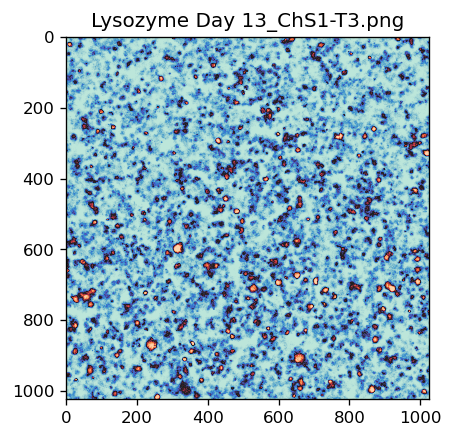

In [4]:
matplotlib.rcParams['figure.dpi'] = 120

plt.axis_off = True
rand_img = np.random.randint(0, len(exp.df) - 1)
plt.imshow(rgb2gray(exp.df.iloc[rand_img]['image']), cmap='icefire')
plt.title(str(exp.df.iloc[rand_img]['filename']))

plt.savefig("figs/_example_image_icefire.png")


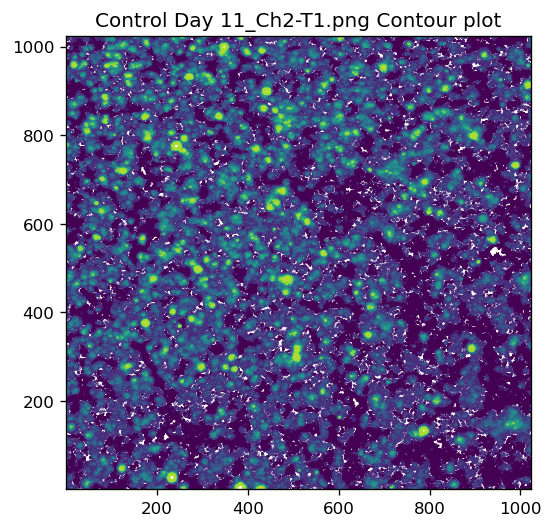

Saved: figs/Control Day 11_Ch2-T1.png_contour.png


<Figure size 720x480 with 0 Axes>

In [5]:
"""
what do contour plots look like
"""

reload(_blob)

sample = exp.df.sample(1)

for idx, row in sample.iterrows():
    _blob.plot_contour(row)

In [6]:
# exp.df['channel'].value_counts()
exp.df.head()

# exp.df['channel'].unique()

,filename,group,day,channel,channel_color,image
0,Control Day 0_Ch2-T1.png,Control,0,Ch2-T1,red,"[[[0, 0, 0], [1, 0, 0], [0, 0, 0], [0, 0, 0], ..."
1,Lysozyme Day 6_ChS1-T3.png,Lysozyme,6,ChS1-T3,blue,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
2,Control Day 10_ChS1-T3.png,Control,10,ChS1-T3,blue,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
3,Ovalbumin Day 3_ChS1-T3.png,Ovalbumin,3,ChS1-T3,blue,"[[[0, 0, 0], [0, 0, 0], [0, 2, 0], [0, 0, 0], ..."
4,Ovalbumin Day 5_Ch1-T4.png,Ovalbumin,5,Ch1-T4,cyan,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


Saved: figs/Lysozyme Day 2_Ch2-T1.png.png
Saved: figs/Ovalbumin Day 3_ChS1-T3.png.png
Saved: figs/Lysozyme Day 2_ChS2-T2.png.png
Saved: figs/Control Day 12_Ch1-T4.png.png


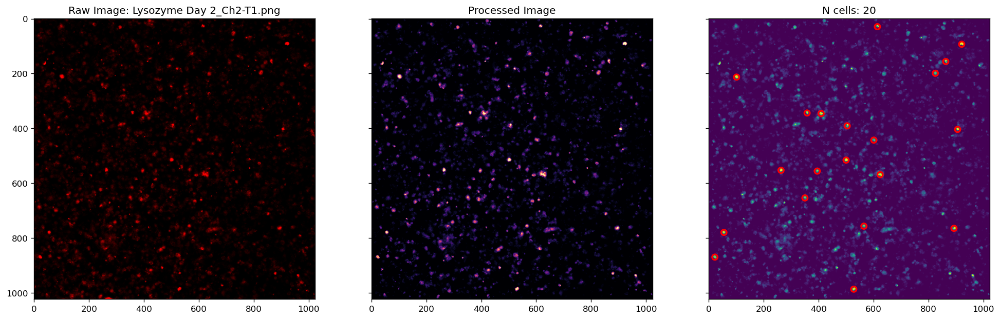

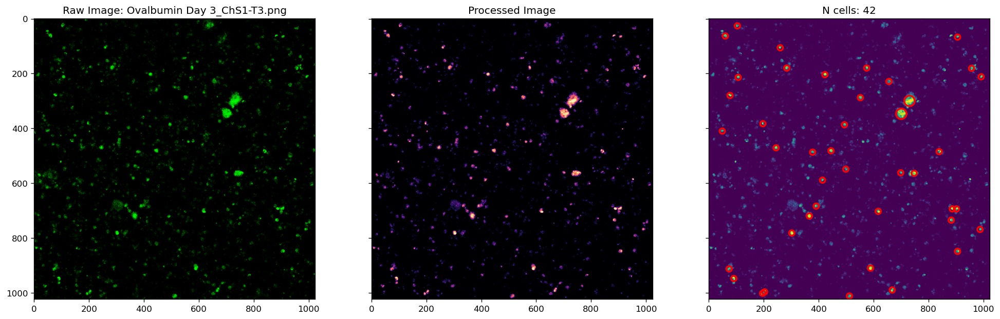

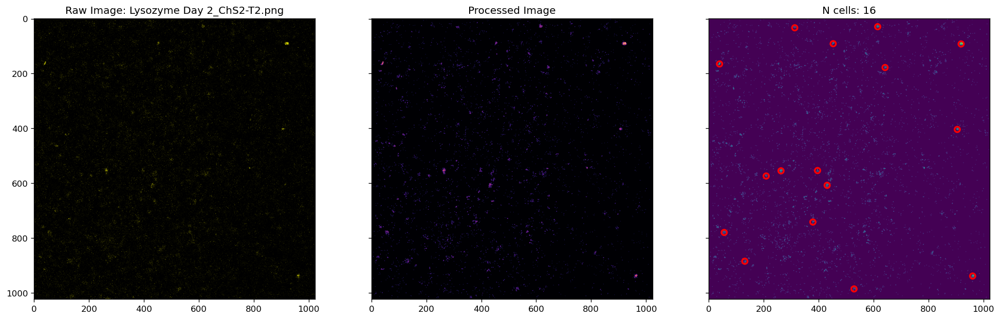

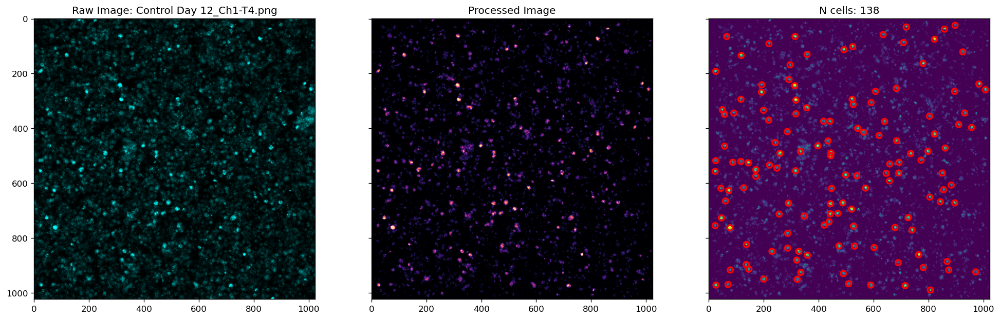

In [7]:
"""
plot a random image
"""

reload(_blob)
# test = exp.df[exp.df['channel'] == 'ChS2-T2']
# test = test[test['group'] == 'Ovalbumin']
# sample = test.sample(1)

sample = exp.df.sample(4)

for idx, row in sample.iterrows():
    _blob.plot_row(row, save=True)

CPU times: user 7 µs, sys: 0 ns, total: 7 µs
Wall time: 10.3 µs


/sw/arcts/centos7/python3.8-anaconda/2020.07/lib/python3.8/site-packages/skimage/feature/blob.py:125: RuntimeWarning: invalid value encountered in double_scalars
  r1 = blob1[-1] / blob2[-1]
/sw/arcts/centos7/python3.8-anaconda/2020.07/lib/python3.8/site-packages/skimage/feature/blob.py:126: RuntimeWarning: divide by zero encountered in true_divide
  pos1 = blob1[:ndim] / (max_sigma * root_ndim)
/sw/arcts/centos7/python3.8-anaconda/2020.07/lib/python3.8/site-packages/skimage/feature/blob.py:127: RuntimeWarning: divide by zero encountered in true_divide
  pos2 = blob2[:ndim] / (max_sigma * root_ndim)
/sw/arcts/centos7/python3.8-anaconda/2020.07/lib/python3.8/site-packages/skimage/feature/blob.py:129: RuntimeWarning: invalid value encountered in subtract
  d = np.sqrt(np.sum((pos2 - pos1)**2))


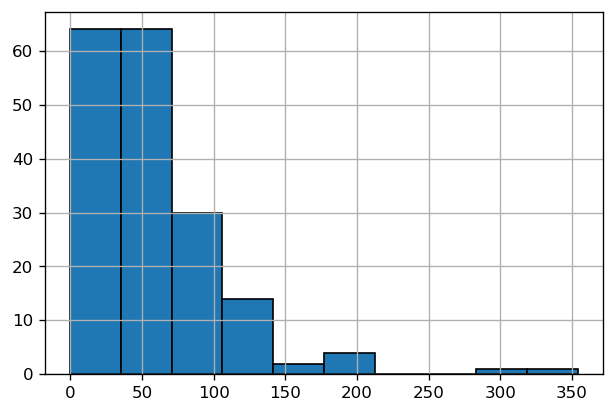

In [8]:
%time

def apply_get_LoG(row):
    img = _blob.preprocess_image(row['image'], row['channel'])
    return _blob.get_LoG_blobs(img, row['channel'])


exp.df['LoG_blobs']  = exp.df.apply(lambda x: apply_get_LoG(x), axis = 1)

# get counts
exp.df['n_blobs_count_1'] = exp.df['LoG_blobs'].apply(len)
exp.df['n_blobs_count_1'].hist(edgecolor='black')

In [9]:
raise ValueError

ValueError: 

In [11]:
exp.df['n_blobs_count_1'].std()

50.901726131373195

In [ ]:
# exp.df['n_blobs_count_1'].hist(edgecolor='black')
# plt.suptitle("Distribution of Estimated Cell Counts by Image")
# plt.savefig("figs/cell_count_histogram.png", bbox_inches='tight')

In [ ]:
# sns.histplot(data=exp.df, x='n_blobs_count_1')

# plt.suptitle("Distribution of Estimated Cell Counts")
# plt.xlabel("N Images")
# plt.savefig("figs/cell_count_histogram.png", bbox_inches='tight')

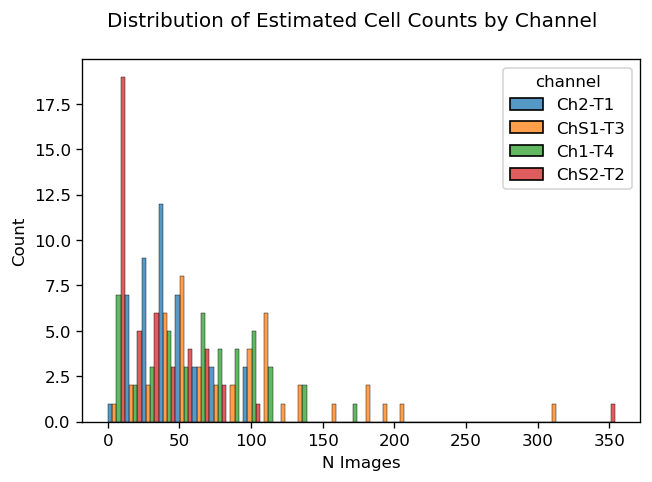

In [12]:
sns.histplot(x='n_blobs_count_1', data=exp.df, hue='channel', multiple="dodge",bins=30)
plt.xlabel("N Images")
plt.suptitle("Distribution of Estimated Cell Counts by Channel")
plt.savefig("figs/cell_count_histogram_by_channel.png", bbox_inches='tight')

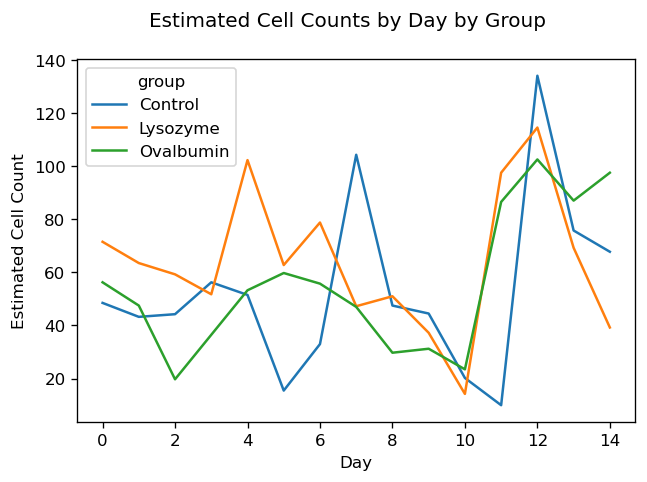

In [13]:
grouped_by_file = exp.df.groupby(['group', 'day'], as_index=False)['n_blobs_count_1'].mean()

sns.lineplot(x='day',
             y='n_blobs_count_1',
             hue='group',
             data=grouped_by_file)

plt.suptitle("Estimated Cell Counts by Day by Group")
plt.ylabel("Estimated Cell Count")
plt.xlabel("Day")
plt.savefig("figs/cell_count_by_day.png", bbox_inches='tight')

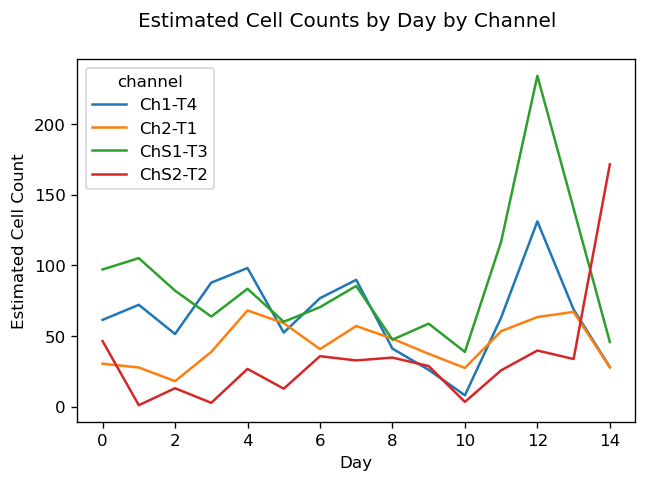

In [14]:
grouped_by_file = exp.df.groupby(['channel', 'day'], as_index=False)['n_blobs_count_1'].mean()

sns.lineplot(x='day',
             y='n_blobs_count_1',
             hue='channel',
             data=grouped_by_file)

plt.suptitle("Estimated Cell Counts by Day by Channel")
plt.ylabel("Estimated Cell Count")
plt.xlabel("Day")
plt.savefig("figs/cell_count_by_channel_day.png", bbox_inches='tight')

In [15]:
# exp.df.head()

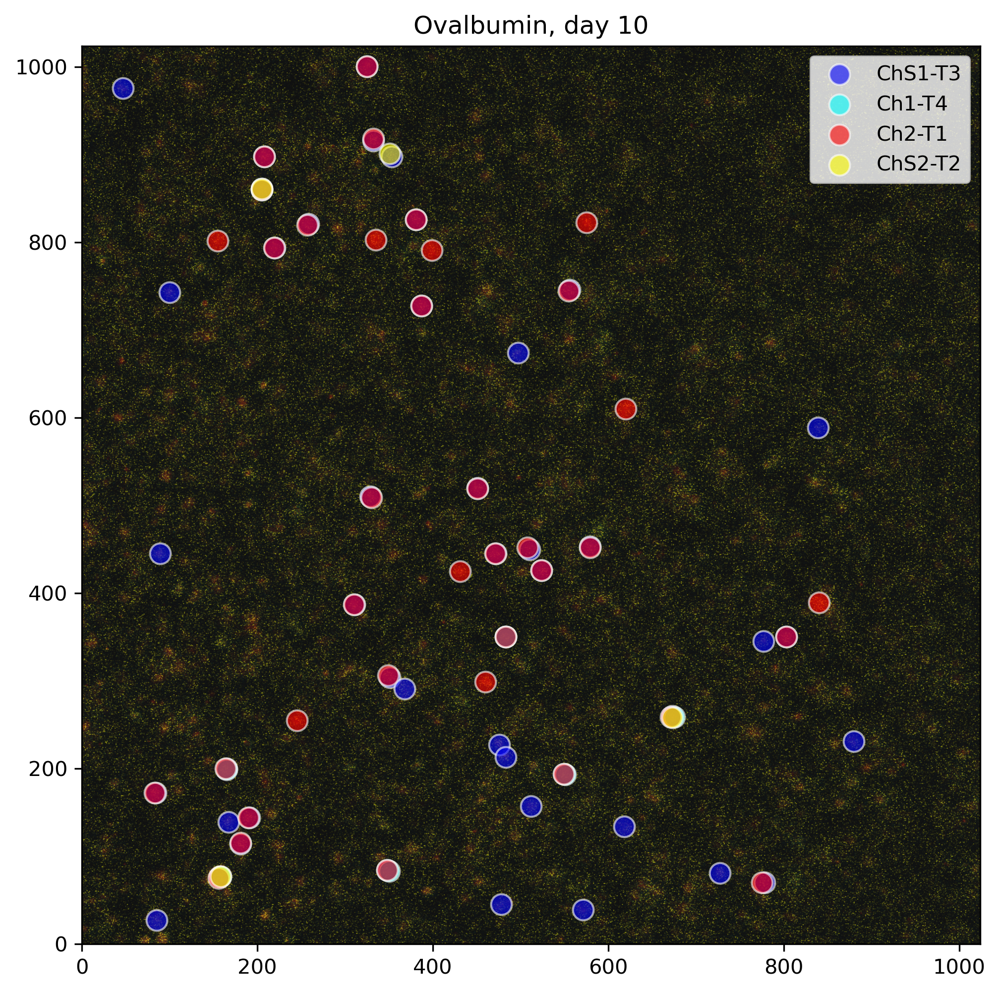

In [24]:
"""
start determining overlap
"""

rand_day = np.random.choice(exp.df['day'], 1)[0]
rand_group = np.random.choice(exp.df['group'], 1)[0]

group_subset = exp.df[(exp.df['day'] == rand_day) & (exp.df['group'] == rand_group)]

matplotlib.rcParams['figure.dpi'] = 300
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim([0,1024])
ax.set_ylim([0,1024])

for idx, row in group_subset.iterrows():
    _color = row['channel_color']

    ax.imshow(row['image'], cmap='gray', alpha=0.5)

    ax.scatter(row['LoG_blobs'][:,1], 
               row['LoG_blobs'][:,0], 
               s=100, 
               marker='o', 
               edgecolor='white',
               alpha=0.6,
               color=_color,
               label=row['channel'])


plt.legend()
plt.title(f"{rand_group}, day {rand_day}")
plt.savefig(f"figs/{rand_group} day {rand_day}_points.png", bbox_inches='tight')


Saved: figs/Control_day_2_red_blue_overlap.png


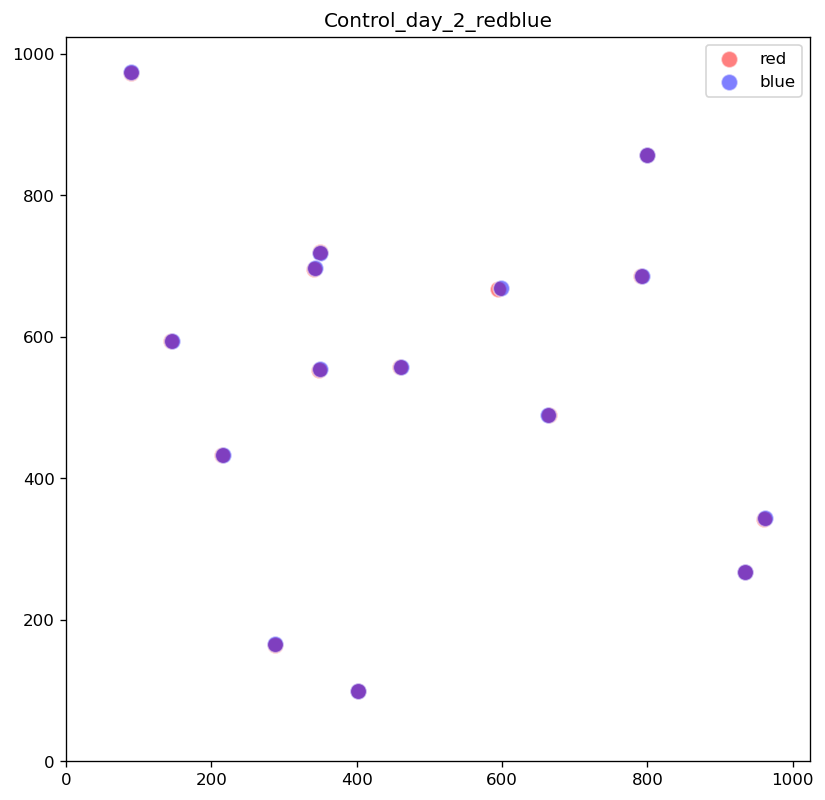

In [32]:
"""
plot overlap for a single day group
"""

reload(_blob)

rand_day = np.random.choice(exp.df['day'], 1)[0]
rand_group = np.random.choice(exp.df['group'], 1)[0]
group_subset = exp.df[(exp.df['day'] == rand_day) & (exp.df['group'] == rand_group)]


_blob.plot_overlap(group_subset, "red", "blue", save=True)      

In [18]:

rand_day = np.random.choice(exp.df['day'], 1)[0]
rand_group = np.random.choice(exp.df['group'], 1)[0]
group_subset = exp.df[(exp.df['day'] == rand_day) & (exp.df['group'] == rand_group)]


def blob_list_to_df(df):
    """ A utility function to covert nested colors to a single 
    dataframe
    
    args:
        : df (pd.DataFrame): with day group
        
    returns:
        blob_frame (pd.DataFrame): dataframe of blobs
    """
    df_list = []
    
    for color in df['channel_color']:
        mask = (df['channel_color'] == color)
        tmp_df = pd.DataFrame(df[mask]['LoG_blobs'].iloc[0])
        tmp_df[color] = 1
        tmp_df['cell_id'] = [f"{color}_{i+1}" for i in range(len(tmp_df)) ]
        df_list.append(tmp_df)

    df = pd.concat(df_list, ignore_index=True)
    df = df.rename(columns={0: 'y_coord', 
                            1: 'x_coord',
                            2: 'radius'})
    df['to_exclude'] = 0
    df = df.fillna(0)
    return df


def get_overlaps(blob_df, color1, color2, threshold):
    """ A function to assign new colors to a point if it overlaps 
    
    args:
        : blob_df (pd.DataFrame): a subset with detected blobs for each channel
        : color1 (str): color one
        : color2 (str):L color two
        : threshold (float): threshold for points considered close
    
    returns:
        : blob_df (pd.DataFrame): with new column indicating which cells
        are overlapping at the location
        : new_column_name (str): the new column name
    """
    new_column_name = "_".join(sorted([color1, color2]))
    
    color1_pts = blob_df[blob_df[color1] == 1].reset_index()
    color2_pts = blob_df[blob_df[color2] == 1].reset_index()

    # compute pairwise distances and 
    # determine close points
    dists = distance_matrix(color1_pts[['y_coord', 'x_coord']], 
                            color2_pts[['y_coord', 'x_coord']])
    
    close_points = np.argwhere((dists < threshold) & (dists != 0))
    
    # create the new column
    blob_df[new_column_name] = 0 
    
    # update new column
    for i, j in close_points:
        orig_c1_idx = color1_pts.iloc[i]['index']
        orig_c2_idx = color2_pts.iloc[j]['index']
        
        blob_df.at[orig_c1_idx, new_column_name] = 1
        blob_df.at[orig_c2_idx, new_column_name] = 1
        
        # flag the second cell as a cell to drop
        blob_df.at[orig_c2_idx, 'to_exclude'] = 1
    return blob_df, new_column_name
    

def apply_resolutions(row, combos):
    """A function to apply resolutions """
    
    primary = ['red', 'blue', 'cyan','yellow']
    
    # the easy case, a primary color only
    if row['sum_pairs'] == 0:
        color = row[primary].sort_values(ascending=False).index[0]
    # the case where there is a single set of colors overlapping
    elif row['sum_pairs'] == 1:
        color = row[combos].sort_values(ascending=False).index[0]   
        
    # more than a pair of colors overlaps
    elif row['sum_pairs'] > 1:
        collisions = []
        
        # get all labeled colors 
        for pair_col in combos:
            if row[pair_col] == 1:
                indiv = pair_col.split("_")
                collisions += indiv
        
        # get the most frequent colors
        _counts = Counter(collisions)       
        most_common = sorted([x[0] for x in _counts.most_common(2)])
        color = "_".join(most_common)

    else:
        color = "WRONG"
        
    return color
        


def resolve_overlap(df, threshold=10):
    """A function to resolve overlapping cells from each of 4 channels 
    
    args:
        : df (pd.DataFrame): a subset with detected blobs for each channel

    returns:
        : cell_colors (list): list cell colors for each cell in the set
    """
    # structure the blobs 
    blob_df = blob_list_to_df(df)
    
    # add all two-color combos
    color_combos = []
    for c1, c2 in list(combinations(df['channel_color'],2)):
        blob_df, new_col = get_overlaps(blob_df, c1, c2, threshold)
        color_combos.append(new_col)
        
        
    # print(blob_df.shape) 
    # # drop exclusions (the second cell in a pair of overlapping)
    blob_df = blob_df[blob_df['to_exclude'] == 0]
    # print(blob_df.shape) 
    
    # compute number of collisions
    blob_df['sum_pairs'] = blob_df[color_combos].sum(axis=1)

    # use simple logic to dismbigaute
    cell_colors =  blob_df.apply(lambda row: apply_resolutions(row, color_combos), axis=1)
    return cell_colors.to_list()
    

resolve_overlap(group_subset)[:10]

['blue_cyan',
 'blue_cyan',
 'blue_cyan',
 'blue',
 'blue',
 'blue',
 'blue_cyan',
 'blue_cyan',
 'blue_cyan',
 'blue_cyan']

In [19]:
"""
DO em all
"""

days = exp.df['day'].unique()
group = exp.df['group'].unique()

new_rows = []

for d in days:
    for g in group:
        mask = (exp.df['day'] == d) & (exp.df['group'] == g)
        day_group = exp.df[mask]
        
        colors = resolve_overlap(day_group)
        
        row = dict(Counter(colors))
        row['day'] = d
        row['group'] = g
        
        new_rows.append(row)
        
lineage_counts = pd.DataFrame(new_rows)
lineage_counts = lineage_counts.fillna(0)
lineage_counts.to_csv("lineage_counts.csv", index=False)
lineage_counts.head()

,blue_red,red,cyan_red,blue,blue_cyan,cyan,day,group,red_yellow,blue_yellow,cyan_yellow,yellow
0,21.0,5,3.0,47,34.0,12.0,0,Control,0.0,0.0,0.0,0.0
1,21.0,5,1.0,50,35.0,3.0,0,Lysozyme,4.0,25.0,9.0,7.0
2,15.0,11,2.0,6,28.0,10.0,0,Ovalbumin,3.0,9.0,11.0,22.0
3,14.0,11,5.0,4,20.0,29.0,6,Control,0.0,0.0,0.0,0.0
4,5.0,11,2.0,24,72.0,27.0,6,Lysozyme,1.0,9.0,6.0,7.0


Saved: figs/primary_color_lineages.png


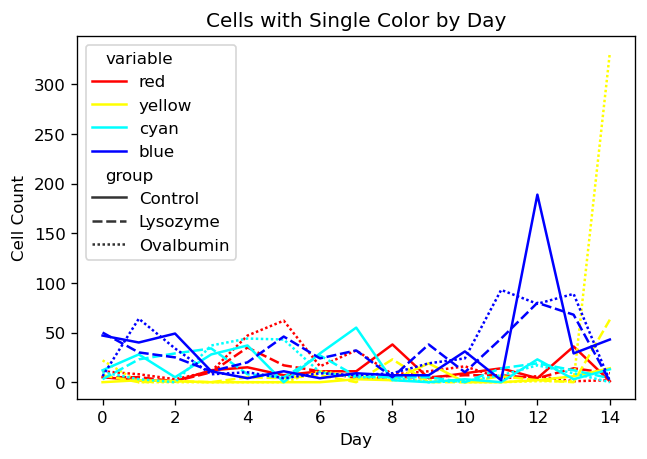

In [20]:
primary = ['red','yellow', 'cyan', 'blue']

tmp = pd.melt(lineage_counts, id_vars=['day', 'group'], value_vars=primary)

sns.lineplot(data=tmp,
             x='day',
             y='value',
             style='group',   
             hue='variable',
             palette=['red', 'yellow', 'cyan', 'blue'])

plt.title("Cells with Single Color by Day")
plt.ylabel("Cell Count")
plt.xlabel("Day")

outpath = f"figs/primary_color_lineages.png"
plt.savefig(outpath, bbox_inches='tight') 
print(f"Saved: {outpath}")


Saved: figs/cyan_lineages.png


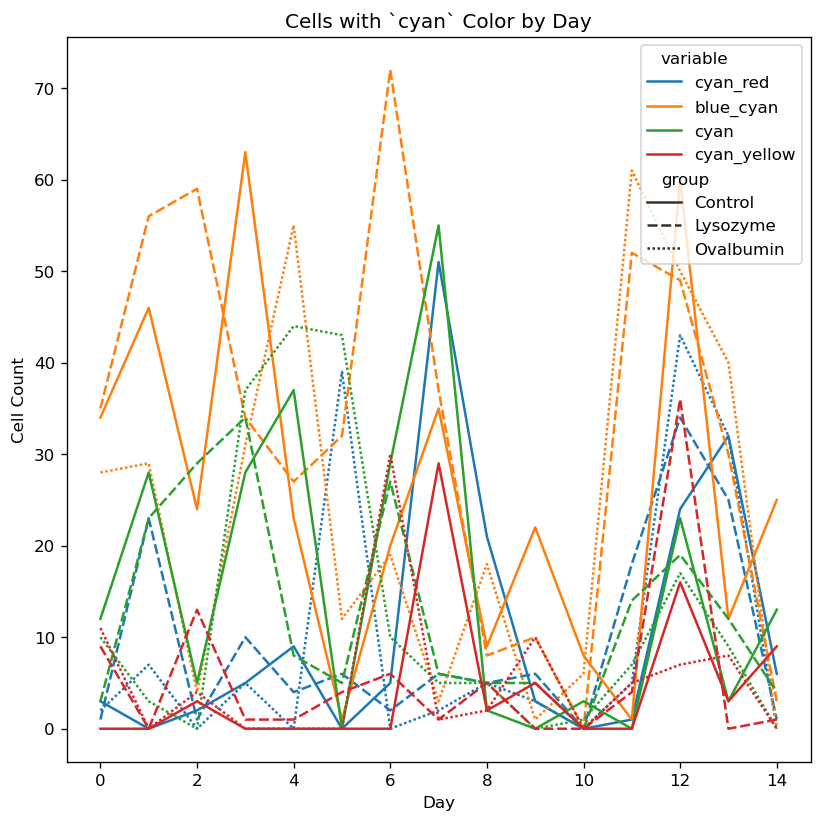

In [21]:
term = "cyan"
COLS = [x for x in lineage_counts.columns if term in x]

tmp = pd.melt(lineage_counts, id_vars=['day', 'group'], value_vars=COLS)

matplotlib.rcParams['figure.figsize'] = (8, 8)

sns.lineplot(data=tmp,
             x='day',
             y='value',
             style='group',   
             hue='variable',
             palette='tab10')

plt.title(f"Cells with `{term}` Color by Day")
plt.ylabel("Cell Count")
plt.xlabel("Day")

outpath = f"figs/{term}_lineages.png"
plt.savefig(outpath, bbox_inches='tight') 
print(f"Saved: {outpath}")

In [33]:
lineage_counts.head()

,blue_red,red,cyan_red,blue,blue_cyan,cyan,day,group,red_yellow,blue_yellow,cyan_yellow,yellow
0,21.0,5,3.0,47,34.0,12.0,0,Control,0.0,0.0,0.0,0.0
1,21.0,5,1.0,50,35.0,3.0,0,Lysozyme,4.0,25.0,9.0,7.0
2,15.0,11,2.0,6,28.0,10.0,0,Ovalbumin,3.0,9.0,11.0,22.0
3,14.0,11,5.0,4,20.0,29.0,6,Control,0.0,0.0,0.0,0.0
4,5.0,11,2.0,24,72.0,27.0,6,Lysozyme,1.0,9.0,6.0,7.0


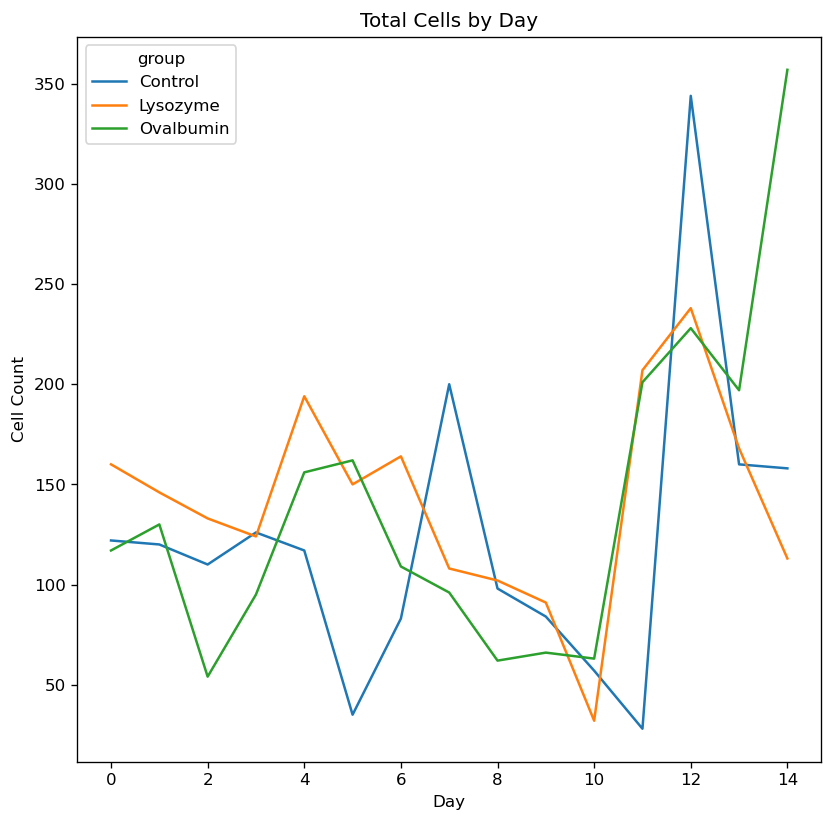

In [39]:
counts = [
    'blue_red', 
    'red', 
    'cyan_red', 
    'blue', 
    'blue_cyan', 
    'cyan', 
    'red_yellow', 
    'blue_yellow', 
    'cyan_yellow', 
    'yellow'
]

lineage_counts['total_cells'] = lineage_counts[counts].sum(axis=1)


sns.lineplot(data=lineage_counts,
            x='day',
            y='total_cells',
            hue='group')

plt.title("Total Cells by Day")
plt.xlabel("Day")
plt.ylabel("Cell Count")


outpath = f"figs/total_cell_counts.png"
plt.savefig(outpath, bbox_inches='tight')

In [47]:
lineage_counts['group'].value_counts()

Ovalbumin    15
Lysozyme     15
Control      15
Name: group, dtype: int64

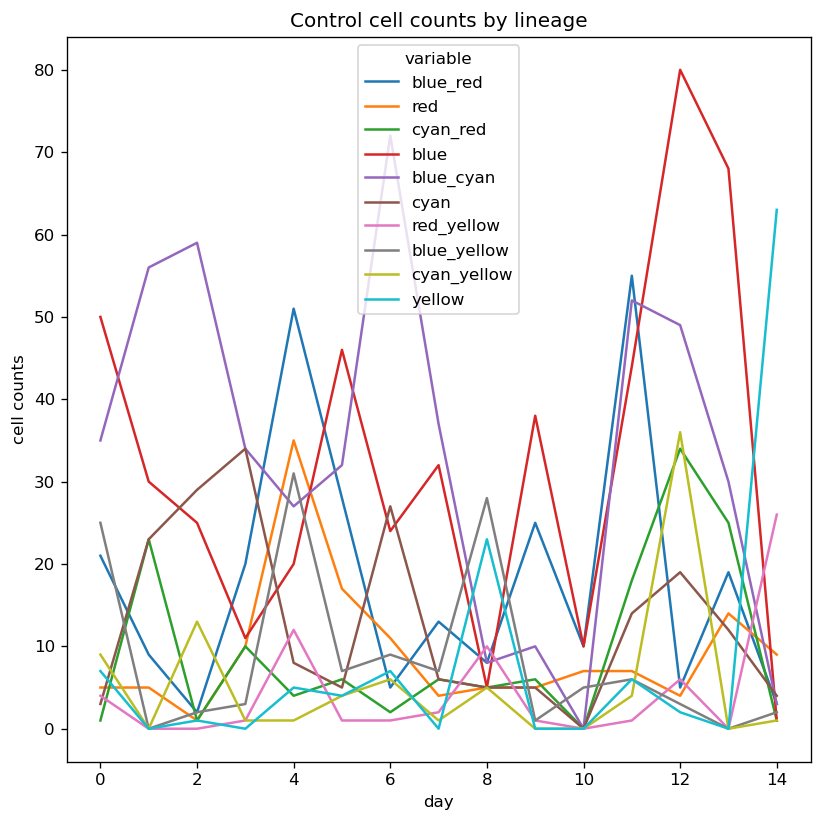

In [51]:
_grp = "Lysozyme"
grp = lineage_counts[lineage_counts['group'] == _grp]

tmp = pd.melt(grp, id_vars=['day'], value_vars=counts)

sns.lineplot(data=tmp,
            x='day',
            y='value',
            hue='variable',
            palette='tab10')

plt.title("Control cell counts by lineage")
plt.xlabel("day")
plt.ylabel("cell counts")

outpath = f"figs/{_grp}_lineages.png"
plt.savefig(outpath, bbox_inches='tight')

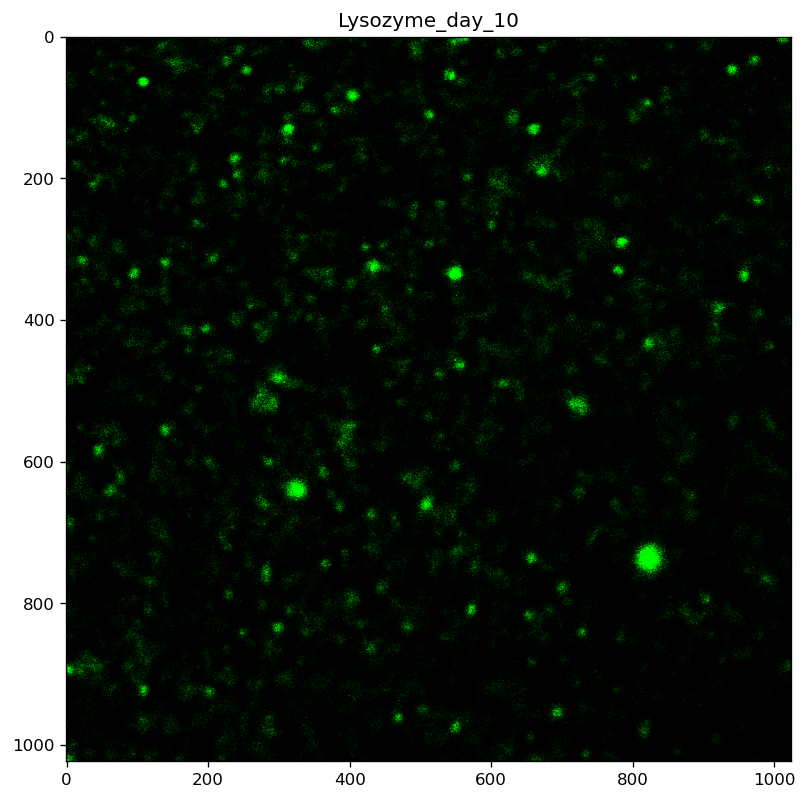

In [65]:
day = 10
mask = (exp.df['channel_color'] == 'blue') & (exp.df['day'] == day)
tmp = exp.df[mask]

for idx, row in tmp.iterrows():
    
    
    plt.imshow(row['image'])
    plt.title(f"{row['group']}_day_{day}")
    outpath = f"figs/THESE_{row['group']}_day_{day}.png"
    plt.savefig(outpath, bbox_inches='tight')
    
    